In [0]:
#Note:Before executing this file 'graphframes_0_8_2_spark3_0_s_2_12.jar' should be loaded into the cluster or the system you are working on.

In [0]:
import urllib 
import pandas as pd
import array
from pyspark.sql import SparkSession

from pyspark.sql.functions import split, col,substring,arrays_zip, col, explode,size

from pyspark.sql.functions import col,isnan, when, count
import pyspark.sql.functions as F
from pyspark.sql.types import IntegerType
import pyspark.sql.types as T

import pyspark.sql.functions as F
from pyspark.sql.types import FloatType


from pyspark.sql.functions import udf

import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import Imputer
from pyspark.ml.feature import ChiSqSelector
from pyspark.ml.linalg import Vectors


from pyspark.ml.classification import LogisticRegression
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.classification import NaiveBayes
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.classification import GBTClassifier


from pyspark.ml.evaluation import MulticlassClassificationEvaluator


from pyspark.ml import Pipeline
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

from graphframes import GraphFrame
from pyspark.sql.functions import desc
from pyspark.sql.types import *

from graphframes import GraphFrame
 
from pyspark.sql.functions import desc

In [0]:
df = pd.read_csv('https://drive.google.com/uc?id=1ehSiKLDxI1os17-8pkbJuB7iVh0TdLqB&confirm=t&uuid=13864ac3-d3dc-4139-93b4-7c238da24eef',encoding='latin1')
spark_session = SparkSession.builder.appName('abc').getOrCreate()
listing = spark_session.createDataFrame(df.astype(str))
display(listing)


urllib.request.urlretrieve("https://drive.google.com/uc?export=download&id=1gTHJJPbbkHcsL1GwKuoM-hCrRUc3x4s_&confirm=t&uuid=ebbc477c-e391-4d2a-a3c3-b023695d5}728", "/tmp/Reviews.csv")
dbutils.fs.mv("file:/tmp/Reviews.csv", "/FileStore/tables/Reviews.csv", True)
reviews = spark.read.csv("/FileStore/tables/Reviews.csv", header=True, inferSchema=True)
display(reviews)

df=listing

/databricks/python/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (5,13) have mixed types.Specify dtype option on import or set low_memory=False.
 has_raised = await self.run_ast_nodes(code_ast.body, cell_name,

listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,2011-12-03,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,f,Buttes-Montmartre,nan,Paris,48.88668,2.33343,Entire apartment,Entire place,2,1.0,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
3705183,39 mÃÂ² Paris (Sacre CÃ âur),10328771,2013-11-29,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Buttes-Montmartre,nan,Paris,48.88617,2.34515,Entire apartment,Entire place,2,1.0,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4082273,"Lovely apartment with Terrace, 60m2",19252768,2014-07-31,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,f,Elysee,nan,Paris,48.88112,2.31712,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4797344,Cosy studio (close to Eiffel tower),10668311,2013-12-17,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Vaugirard,nan,Paris,48.84571,2.30584,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,24837558,2014-12-14,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,f,Passy,nan,Paris,48.855,2.26979,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4898654,NEW - Charming apartment Le Marais,505535,2011-04-13,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Temple,nan,Paris,48.86428,2.3537,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]",95,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
6021700,2P - Entre Bastille et Republique,8053690,2013-08-09,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Popincourt,nan,Paris,48.86384,2.37101,Entire apartment,Entire place,2,1.0,"[""Shampoo"", ""TV"", ""Kitchen"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed""]",80,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
6945740,57sqm btw. Bastille & PÃÂ¨re Lachaise,5924709,2013-04-14,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Popincourt,nan,Paris,48.86043,2.37842,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",59,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
7491966,Charming appartment near the Parc Buttes Chaumont,35812762,2015-06-14,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Buttes-Chaumont,nan,Paris,48.87871,2.37489,Entire apartment,Entire place,2,1.0,"[""Paid parking off premises"", ""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]",80,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
7849932,Bel appartement plein de charme !,20833291,2014-09-02,"Paris, Ile-de-France, Fran

listing_id,review_id,date,reviewer_id
11798,330265172,2018-09-30T00:00:00.000+0000,11863072
15383,330103585,2018-09-30T00:00:00.000+0000,39147453
16455,329985788,2018-09-30T00:00:00.000+0000,1125378
17919,330016899,2018-09-30T00:00:00.000+0000,172717984
26827,329995638,2018-09-30T00:00:00.000+0000,17542859
74561,330089224,2018-09-30T00:00:00.000+0000,173044789
140355,330194958,2018-09-30T00:00:00.000+0000,160093807
162163,329980859,2018-09-30T00:00:00.000+0000,94026758
167998,329950677,2018-09-30T00:00:00.000+0000,35388162
178188,330213008,2018-09-30T00:00:00.000+0000,3652511


Cleaning the data

In [0]:
display(df.select([count(when(isnan(c), c)).alias(c) for c in df.columns]))

listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
0,173,0,165,840,128782,128782,113087,165,165,165,165,0,242700,0,0,0,0,0,0,29435,0,0,0,0,91405,91713,91665,91771,91687,91775,91785,0


In [0]:
df=df.withColumn("bedrooms",df["bedrooms"].cast(IntegerType()))
df=df.withColumn("review_scores_value",df["review_scores_value"].cast(IntegerType()))
df=df.withColumn("review_scores_rating",df["review_scores_rating"].cast(IntegerType()))
df=df.withColumn("review_scores_accuracy",df["review_scores_accuracy"].cast(IntegerType()))
df=df.withColumn("review_scores_cleanliness",df["review_scores_cleanliness"].cast(IntegerType()))
df=df.withColumn("review_scores_communication",df["review_scores_communication"].cast(IntegerType()))
df=df.withColumn("review_scores_location",df["review_scores_location"].cast(IntegerType()))
df=df.withColumn("review_scores_checkin",df["review_scores_checkin"].cast(IntegerType()))
df=df.withColumn("review_scores_value",df["review_scores_value"].cast(IntegerType()))
df=df.withColumn("host_response_rate",df["host_response_rate"].cast(IntegerType()))
df=df.withColumn("host_acceptance_rate",df["host_acceptance_rate"].cast(IntegerType()))
df=df.withColumn("price",df["price"].cast(IntegerType()))
df=df.withColumn("listing_id",df["listing_id"].cast(IntegerType()))
df=df.withColumn("host_id",df["host_id"].cast(IntegerType()))
df=df.withColumn("host_total_listings_count",df["host_total_listings_count"].cast(IntegerType()))
df=df.withColumn("accommodates",df["accommodates"].cast(IntegerType()))
df=df.withColumn("minimum_nights",df["minimum_nights"].cast(IntegerType()))
df=df.withColumn("maximum_nights",df["maximum_nights"].cast(IntegerType()))

In [0]:
test_11 = Imputer(inputCols=["bedrooms"], outputCols=["bedrooms_1"])
test_12 = Imputer(inputCols=["review_scores_value"], outputCols=["review_scores_value_1"])
test_13 = Imputer(inputCols=["review_scores_rating"], outputCols=["review_scores_rating_1"])
test_14 = Imputer(inputCols=["review_scores_accuracy"], outputCols=["review_scores_accuracy_1"])
test_15 = Imputer(inputCols=["review_scores_cleanliness"], outputCols=["review_scores_cleanliness_1"])
test_16 = Imputer(inputCols=["review_scores_communication"], outputCols=["review_scores_communication_1"])
test_17 = Imputer(inputCols=["review_scores_location"], outputCols=["review_scores_location_1"])
test_18 = Imputer(inputCols=["review_scores_value"], outputCols=["review_scores_value_1"])
test_19 = Imputer(inputCols=["review_scores_checkin"], outputCols=["review_scores_checkin_1"])
test_110 = Imputer(inputCols=["host_response_rate"], outputCols=["host_response_rate_1"])
test_111 = Imputer(inputCols=["host_acceptance_rate"], outputCols=["host_acceptance_rate_1"])


In [0]:
test_21=StringIndexer(inputCol='neighbourhood',outputCol='neighbourhood_1')
test_22=StringIndexer(inputCol='city',outputCol='city_1')
test_23=StringIndexer(inputCol='property_type',outputCol='property_type_1')
test_24=StringIndexer(inputCol='instant_bookable',outputCol='instant_bookable_1')
test_25=StringIndexer(inputCol='host_is_superhost',outputCol='host_is_superhost_1')
test_26=StringIndexer(inputCol='host_identity_verified',outputCol='host_identity_verified_1')
test_27=StringIndexer(inputCol='room_type',outputCol='room_type_1')

In [0]:
pipeline = Pipeline(stages=[test_11,test_12,test_13,test_14,test_15,test_16,test_17,test_18,test_19,test_110,test_11,test_21,test_22,test_23,test_24,test_25,test_26,test_27])
model = pipeline.fit(df)
indexed = model.transform(df)


In [0]:
indexed=indexed.drop(*['name','host_since','district','host_response_time','review_scores_value','bedrooms','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_communication','review_scores_location','review_scores_value','review_scores_checkin','host_response_rate','host_acceptance_rate','longitude','latitude'])

In [0]:
display(indexed.select([count(when(isnan(c), c)).alias(c) for c in indexed.columns]))

listing_id,host_id,host_location,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,city,property_type,room_type,accommodates,amenities,price,minimum_nights,maximum_nights,instant_bookable,bedrooms_1,review_scores_value_1,review_scores_rating_1,review_scores_accuracy_1,review_scores_cleanliness_1,review_scores_communication_1,review_scores_location_1,review_scores_checkin_1,host_response_rate_1,neighbourhood_1,city_1,property_type_1,instant_bookable_1,host_is_superhost_1,host_identity_verified_1,room_type_1
0,0,840,165,0,165,165,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
df=indexed.na.drop('any')

In [0]:
@udf(T.ArrayType(T.StringType()))
def test1(amenities):
    string=amenities
    return string[2:-2].split('", "')

df = df.withColumn('amenities', test1(df.amenities))

In [0]:
display(df.groupBy('amenities').count())

amenities,count
"List(Dishes and silverware, Hangers, Coffee maker, Iron, Dedicated workspace, Smoke alarm, Essentials, Bed linens, TV, Paid parking off premises, Heating, Washer, Kitchen, Refrigerator, Cooking basics, Hot water, Hair dryer, Wifi, Long term stays allowed, Host greets you, Microwave)",1
"List(Shampoo, Heating, Hair dryer, Dedicated workspace, Smoke alarm, Wifi, Dishes and silverware, Kitchen, Refrigerator, Cooking basics, Hot water, Hangers, Essentials, Private entrance, Host greets you, Long term stays allowed, Luggage dropoff allowed, Stove, Carbon monoxide alarm)",1
"List(Heating, Hair dryer, Wifi, Refrigerator, Essentials, Long term stays allowed, TV, Coffee maker)",1
"List(Shampoo, Heating, Elevator, Hair dryer, Dedicated workspace, Smoke alarm, Wifi, Kitchen, Hot water, Essentials, Long term stays allowed, TV)",1
"List(Shampoo, First aid kit, Garden or backyard, Heating, TV, Iron, Kitchen, Hair dryer, Essentials, Washer, Dryer, Carbon monoxide alarm, Hot water, Hangers, Smoke alarm, Wifi, Long term stays allowed, Dedicated workspace)",1
"List(Heating, Washer, Dryer, Elevator, Smoke alarm, Wifi, Kitchen, Long term stays allowed, Hangers, TV)",1
"List(Elevator, Dishes and silverware, Hangers, Carbon monoxide alarm, Iron, Dedicated workspace, Smoke alarm, Essentials, Bed linens, Dishwasher, Shampoo, Heating, Washer, Kitchen, Refrigerator, Hot water, Oven, Hair dryer, Wifi, Long term stays allowed, Microwave)",4
"List(Shampoo, First aid kit, Heating, TV, Indoor fireplace, Kitchen, Essentials, Washer, Elevator, Smoke alarm, Wifi, Fire extinguisher, Long term stays allowed, Cable TV)",1
"List(Heating, Washer, Hair dryer, Dryer, Indoor fireplace, Cable TV, Dedicated workspace, Kitchen, Essentials, Long term stays allowed, TV)",1
"List(Patio or balcony, Elevator, Pack \u2019n Play/travel crib, Dishes and silverware, Pocket wifi, Freezer, Stove, Coffee maker, Iron, Dryer, Smoke alarm, Essentials, Dishwasher, Paid parking off premises, Heating, Washer, Kitchen, Refrigerator, Cooking basics, Hot water, Oven, Long term stays allowed, Host greets you, Cleaning before checkout)",1


Visualization

In [0]:
dfe=df.drop('neighbourhood_1','property_type_1','instant_bookable_1','host_is_superhost_1','host_identity_verified_1','room_type_1','host_has_profile_pic_1','room_type_1')
df_pd=dfe.toPandas()

In [0]:
display(df_pd)

listing_id,host_id,host_location,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,city,property_type,room_type,accommodates,amenities,price,minimum_nights,maximum_nights,instant_bookable,bedrooms_1,review_scores_value_1,review_scores_rating_1,review_scores_accuracy_1,review_scores_cleanliness_1,review_scores_communication_1,review_scores_location_1,review_scores_checkin_1,host_response_rate_1,city_1
281420,1466919,"Paris, Ile-de-France, France",f,1,t,f,Buttes-Montmartre,Paris,Entire apartment,Entire place,2,"List(Heating, Kitchen, Washer, Wifi, Long term stays allowed)",53,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
3705183,10328771,"Paris, Ile-de-France, France",f,1,t,t,Buttes-Montmartre,Paris,Entire apartment,Entire place,2,"List(Shampoo, Heating, Kitchen, Essentials, Washer, Dryer, Wifi, Long term stays allowed)",120,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
4082273,19252768,"Paris, Ile-de-France, France",f,1,t,f,Elysee,Paris,Entire apartment,Entire place,2,"List(Heating, TV, Kitchen, Washer, Wifi, Long term stays allowed)",89,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
4797344,10668311,"Paris, Ile-de-France, France",f,1,t,t,Vaugirard,Paris,Entire apartment,Entire place,2,"List(Heating, TV, Kitchen, Wifi, Long term stays allowed)",58,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
4823489,24837558,"Paris, Ile-de-France, France",f,1,t,f,Passy,Paris,Entire apartment,Entire place,2,"List(Heating, TV, Kitchen, Essentials, Hair dryer, Washer, Dryer, Bathtub, Wifi, Elevator, Long term stays allowed, Cable TV)",60,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
4898654,505535,"Paris, Ile-de-France, France",f,1,t,t,Temple,Paris,Entire apartment,Entire place,2,"List(Heating, TV, Kitchen, Essentials, Washer, Smoke alarm, Wifi, Long term stays allowed, Cable TV)",95,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
6021700,8053690,"Paris, Ile-de-France, France",f,1,t,t,Popincourt,Paris,Entire apartment,Entire place,2,"List(Shampoo, TV, Kitchen, Washer, Smoke alarm, Wifi, Fire extinguisher, Long term stays allowed)",80,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
6945740,5924709,"Paris, Ile-de-France, France",f,1,t,t,Popincourt,Paris,Entire apartment,Entire place,2,"List(Heating, TV, Kitchen, Essentials, Washer, Dryer, Smoke alarm, Wifi, Long term stays allowed)",59,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
7491966,35812762,"Paris, Ile-de-France, France",f,1,t,t,Buttes-Chaumont,Paris,Entire apartment,Entire place,2,"List(Paid parking off premises, Shampoo, Heating, TV, Iron, Kitchen, Hair dryer, Essentials, Washer, Hot water, Hangers, Smoke alarm, Wifi, Long term stays allowed, Dedicated workspace, Host greets you, Cable TV)",80,2,1125,f,1,10,100,10,10,10,10,10,0,0.0
7849932,20833291,"Paris, Ile-de-France, France",f,1,t,t,Opera,Paris,Entire apartment,Entire place,2,"List(Heating, TV, Iron, Kitchen, Essentials, Hair dryer, Washer, Hangers, Wifi, Elevator, Long term stays allowed, Dedicated workspace, Cable TV)",90,2,1125,f,1,10,100,10,10,10,10,10,0,0.0


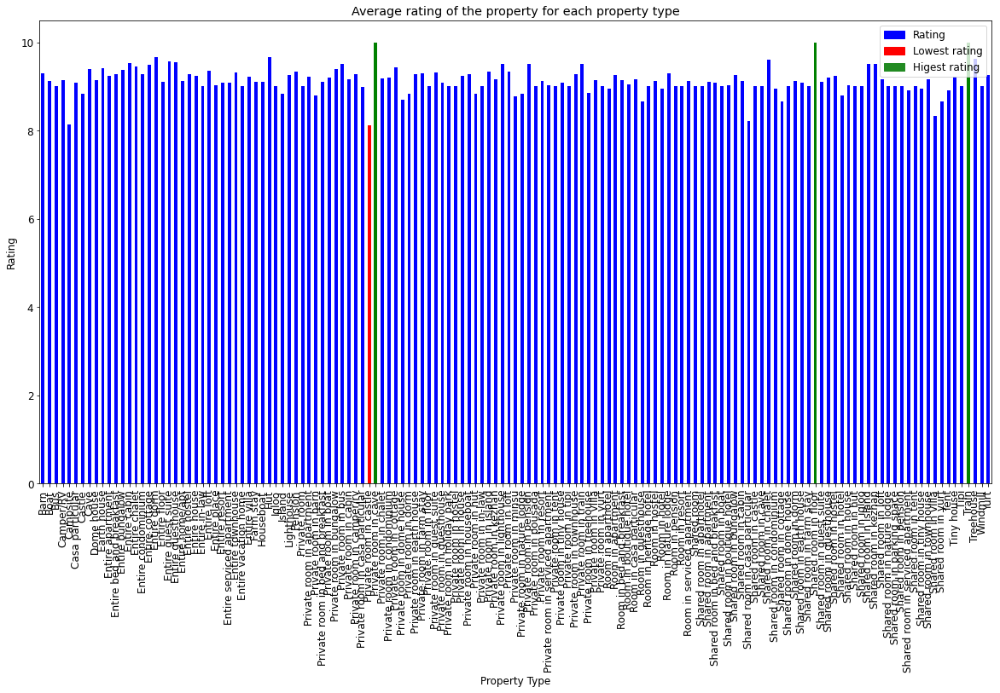

In [0]:
x=df_pd.groupby('property_type').mean('review_scores_value_1').reset_index()
x.index=x['property_type']

condition =['red' if(x['review_scores_value_1'].iloc[u] == min(x['review_scores_value_1'].tolist())) else('green' if(x['review_scores_value_1'].iloc[u] == max(x['review_scores_value_1'].tolist())) else 'blue')for u in range(1,len(x)-1)]

font = {'family' : 'normal','weight' : 'normal','size'   : 10}
fig = plt.figure(figsize = (20, 10))
x['review_scores_value_1'].plot.bar(color=['blue']+condition)
plt.xlabel("Property Type")
plt.ylabel("Rating")
plt.title("Average rating of the property for each property type")

red = mpatches.Patch(color='#FF0000', label='Lowest rating')
green = mpatches.Patch(color='#228B22', label='Higest rating')
blue = mpatches.Patch(color='#0000FF', label='Rating')

plt.legend(handles=[blue,red,green])
plt.show()

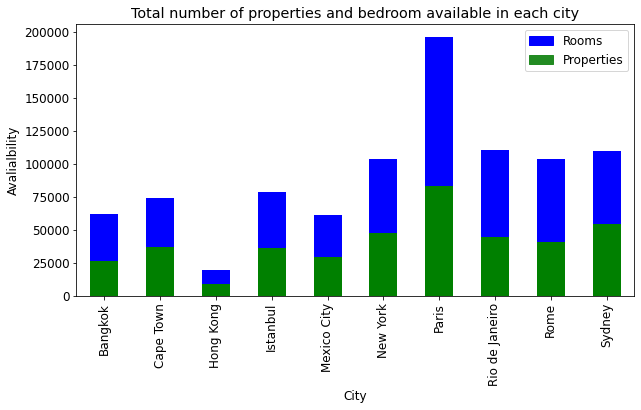

In [0]:

import matplotlib.patches as mpatches
x=df_pd.groupby('city').sum().reset_index()
x.index=x['city']

font = {'family' : 'normal','weight' : 'normal','size'   : 10}
fig = plt.figure(figsize = (10, 5))
ax=x['accommodates'].plot.bar(color='blue')
x['bedrooms_1'].plot.bar(color='green',ax=ax)
green = mpatches.Patch(color='#228B22', label='Properties')
blue = mpatches.Patch(color='#0000FF', label='Rooms')
plt.legend(handles=[blue,green])

plt.xlabel("City")
plt.ylabel("Avalialbility")
plt.title("Total number of properties and bedroom available in each city")
plt.show()

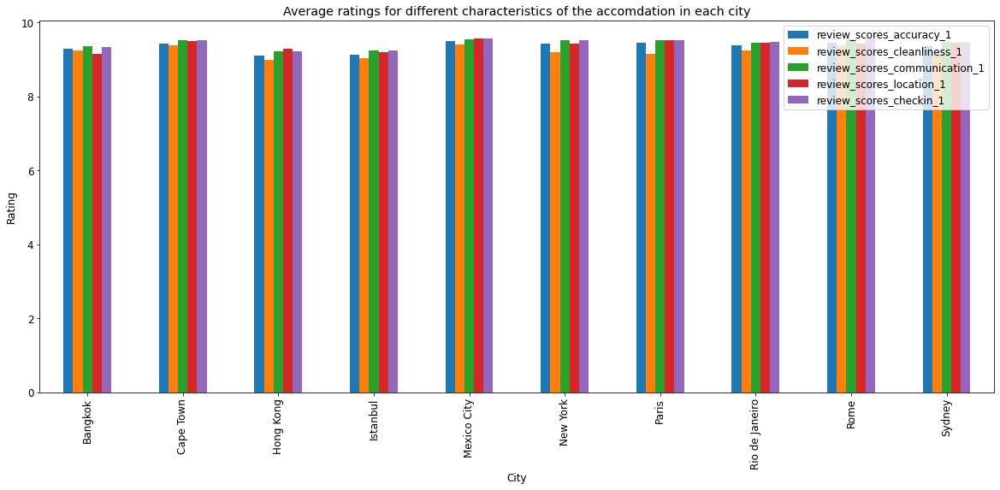

In [0]:
x=df_pd.groupby('city').mean().reset_index()
x.index=x['city']

font = {'family' : 'normal','weight' : 'normal','size'   : 12}
matplotlib.rc('font', **font)
x[['review_scores_accuracy_1','review_scores_cleanliness_1', 'review_scores_communication_1', 'review_scores_location_1', 'review_scores_checkin_1']].plot.bar(figsize = (20,8))
plt.xlabel("City")
plt.ylabel("Rating")
plt.title("Average ratings for different characteristics of the accomdation in each city")
plt.show()

In [0]:
def flatten(l):
    return [item for sublist in l for item in sublist]
def dis(items):
    counts = dict()
    for i in items:
        counts[i] = counts.get(i, 0) + 1
    return counts

x=df_pd[['city','room_type','amenities']]
x['amenities_1']=[x.tolist() for x in x['amenities']]
x=x.groupby('city')['amenities_1'].apply(list).reset_index()
x['amenities_2']=[flatten(x) for x in x['amenities_1']]

x['amenities']=[ dis(x) for x in x['amenities_2']]

<command-1909608037362062>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
 x['amenities_1']=[x.tolist() for x in x['amenities']]

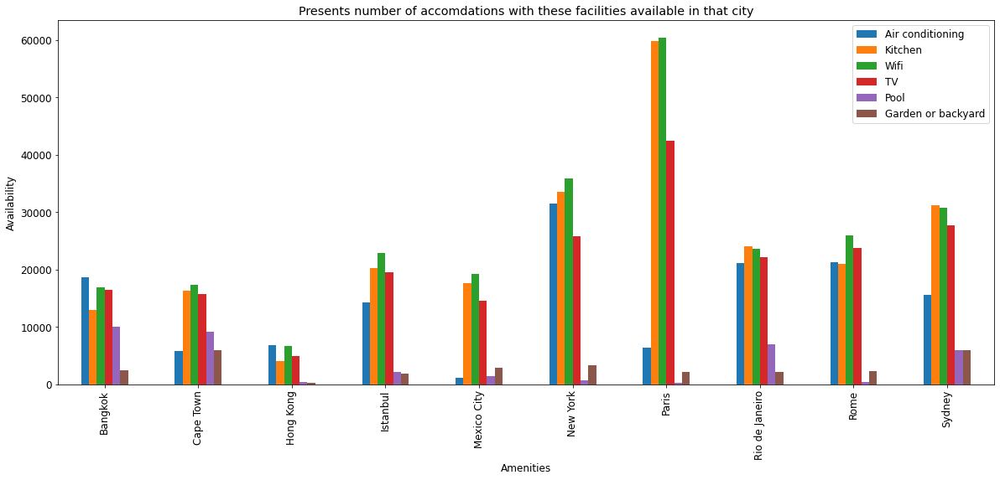

In [0]:
y = pd.json_normalize(x['amenities'])
y.index=x['city']
y=y.fillna(0)

font = {'family' : 'normal','weight' : 'normal','size'   : 10}
fig = plt.figure(figsize = (40,20))
y[['Air conditioning','Kitchen','Wifi', 'TV','Pool','Garden or backyard']].plot.bar(figsize = (20, 8))
plt.xlabel("Amenities")
plt.ylabel("Availability")
plt.title("Presents number of accomdations with these facilities available in that city")
plt.show()

Clasification model

In [0]:
dfl=df
dfl=dfl.drop('neighbourhood','property_type','instant_bookable','host_is_superhost','host_identity_verified','room_type','host_has_profile_pic','room_type')
dfl=dfl.withColumnRenamed("neighbourhood_1","neighbourhood").withColumnRenamed("property_type_1","property_type").withColumnRenamed("instant_bookable_1","instant_bookable").withColumnRenamed("host_is_superhost_1","host_is_superhost").withColumnRenamed("host_identity_verified_1","host_identity_verified").withColumnRenamed("room_type_1","room_type")

In [0]:
display(dfl)
dfl=dfl.drop('host_location','amenities','city')
dfl=dfl.select(*(col(c).cast("integer").alias(c) for c in dfl.columns))
print(dfl.columns)
dfl.printSchema()

listing_id,host_id,host_location,host_total_listings_count,city,accommodates,amenities,price,minimum_nights,maximum_nights,bedrooms_1,review_scores_value_1,review_scores_rating_1,review_scores_accuracy_1,review_scores_cleanliness_1,review_scores_communication_1,review_scores_location_1,review_scores_checkin_1,host_response_rate_1,neighbourhood,city_1,property_type,instant_bookable,host_is_superhost,host_identity_verified,room_type
281420,1466919,"Paris, Ile-de-France, France",1,Paris,2,"List(Heating, Kitchen, Washer, Wifi, Long term stays allowed)",53,2,1125,1,10,100,10,10,10,10,10,0,4.0,0.0,0.0,0.0,0.0,1.0,0.0
3705183,10328771,"Paris, Ile-de-France, France",1,Paris,2,"List(Shampoo, Heating, Kitchen, Essentials, Washer, Dryer, Wifi, Long term stays allowed)",120,2,1125,1,10,100,10,10,10,10,10,0,4.0,0.0,0.0,0.0,0.0,0.0,0.0
4082273,19252768,"Paris, Ile-de-France, France",1,Paris,2,"List(Heating, TV, Kitchen, Washer, Wifi, Long term stays allowed)",89,2,1125,1,10,100,10,10,10,10,10,0,42.0,0.0,0.0,0.0,0.0,1.0,0.0
4797344,10668311,"Paris, Ile-de-France, France",1,Paris,2,"List(Heating, TV, Kitchen, Wifi, Long term stays allowed)",58,2,1125,1,10,100,10,10,10,10,10,0,7.0,0.0,0.0,0.0,0.0,0.0,0.0
4823489,24837558,"Paris, Ile-de-France, France",1,Paris,2,"List(Heating, TV, Kitchen, Essentials, Hair dryer, Washer, Dryer, Bathtub, Wifi, Elevator, Long term stays allowed, Cable TV)",60,2,1125,1,10,100,10,10,10,10,10,0,17.0,0.0,0.0,0.0,0.0,1.0,0.0
4898654,505535,"Paris, Ile-de-France, France",1,Paris,2,"List(Heating, TV, Kitchen, Essentials, Washer, Smoke alarm, Wifi, Long term stays allowed, Cable TV)",95,2,1125,1,10,100,10,10,10,10,10,0,22.0,0.0,0.0,0.0,0.0,0.0,0.0
6021700,8053690,"Paris, Ile-de-France, France",1,Paris,2,"List(Shampoo, TV, Kitchen, Washer, Smoke alarm, Wifi, Fire extinguisher, Long term stays allowed)",80,2,1125,1,10,100,10,10,10,10,10,0,6.0,0.0,0.0,0.0,0.0,0.0,0.0
6945740,5924709,"Paris, Ile-de-France, France",1,Paris,2,"List(Heating, TV, Kitchen, Essentials, Washer, Dryer, Smoke alarm, Wifi, Long term stays allowed)",59,2,1125,1,10,100,10,10,10,10,10,0,6.0,0.0,0.0,0.0,0.0,0.0,0.0
7491966,35812762,"Paris, Ile-de-France, France",1,Paris,2,"List(Paid parking off premises, Shampoo, Heating, TV, Iron, Kitchen, Hair dryer, Essentials, Washer, Hot water, Hangers, Smoke alarm, Wifi, Long term stays allowed, Dedicated workspace, Host greets you, Cable TV)",80,2,1125,1,10,100,10,10,10,10,10,0,12.0,0.0,0.0,0.0,0.0,0.0,0.0
7849932,20833291,"Paris, Ile-de-France, France",1,Paris,2,"List(Heating, TV, Iron, Kitchen, Essentials, Hair dryer, Washer, Hangers, Wifi, Elevator, Long term stays allowed, Dedicated workspace, Cable TV)",90,2,1125,1,10,100,10,10,10,10,10,0,18.0,0.0,0.0,0.0,0.0,0.0,0.0


['listing_id', 'host_id', 'host_total_listings_count', 'accommodates', 'price', 'minimum_nights', 'maximum_nights', 'bedrooms_1', 'review_scores_value_1', 'review_scores_rating_1', 'review_scores_accuracy_1', 'review_scores_cleanliness_1', 'review_scores_communication_1', 'review_scores_location_1', 'review_scores_checkin_1', 'host_response_rate_1', 'neighbourhood', 'city_1', 'property_type', 'instant_bookable', 'host_is_superhost', 'host_identity_verified', 'room_type']
root
-- listing_id: integer (nullable = true)
-- host_id: integer (nullable = true)
-- host_total_listings_count: integer (nullable = true)
-- accommodates: integer (nullable = true)
-- price: integer (nullable = true)
-- minimum_nights: integer (nullable = true)
-- maximum_nights: integer (nullable = true)
-- bedrooms_1: integer (nullable = true)
-- review_scores_value_1: integer (nullable = true)
-- review_scores_rating_1: integer (nullable = true)
-- review_scores_accuracy_1: integer (nullable = true)
-- review_scores_cleanliness_1: integer (nullable = true)
-- review_scores_communication_1: integer (nullable = true)
-- review_scores_location_1: integer (nullable = true)
-- review_scores_checkin_1: integer (nullable = true)
-- host_response_rate_1: integer (nullable = true)
-- neighbourhood: integer (nullable = true)
-- city_1: integer (nullable = true)
-- property_type: integer (nullable = true)
-- instant_bookable: integer (nullable = true)
-- host_is_superhost: integer (nullable = true)
-- host_identity_verified: integer (nullable = true)
-- room_type: integer (nullable = true)

In [0]:
display(dfl.select([count(when(isnan(c), c)).alias(c) for c in dfl.columns]))

listing_id,host_id,host_total_listings_count,accommodates,price,minimum_nights,maximum_nights,bedrooms_1,review_scores_value_1,review_scores_rating_1,review_scores_accuracy_1,review_scores_cleanliness_1,review_scores_communication_1,review_scores_location_1,review_scores_checkin_1,host_response_rate_1,neighbourhood,city_1,property_type,instant_bookable,host_is_superhost,host_identity_verified,room_type
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
assembler=VectorAssembler(inputCols=['host_total_listings_count', 'accommodates', 'price', 'minimum_nights', 'maximum_nights', 'bedrooms_1', 'review_scores_value_1', 'review_scores_rating_1', 'review_scores_cleanliness_1', 'review_scores_communication_1', 'review_scores_location_1', 'review_scores_checkin_1', 'host_response_rate_1', 'neighbourhood', 'city_1', 'property_type', 'host_is_superhost', 'host_identity_verified', 'room_type','review_scores_rating_1'],outputCol="features")
df_out=assembler.transform(dfl)
df_final=df_out.select("features","instant_bookable")

In [0]:
selector = ChiSqSelector(numTopFeatures=10, featuresCol="features",outputCol="selectedFeatures", labelCol="instant_bookable")
model = selector.fit(df_final)
final=model.transform(df_final)
print("The top features are as follows %d" % selector.getNumTopFeatures())

The top features are as follows 10

In [0]:
train_df,test_df=final.drop('features').randomSplit([0.75,0.25])
display(final)

features,instant_bookable,selectedFeatures
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 53.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 4.0, 0.0, 0.0, 0.0, 1.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 53.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 120.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 120.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 89.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 42.0, 0.0, 0.0, 0.0, 1.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 89.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 58.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 7.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 58.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 60.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 17.0, 0.0, 0.0, 0.0, 1.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 60.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 95.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 22.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 95.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 80.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 80.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 59.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 59.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 80.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 80.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"
"Map(vectorType -> dense, length -> 20, values -> List(1.0, 2.0, 90.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0, 10.0, 10.0, 0.0, 18.0, 0.0, 0.0, 0.0, 0.0, 0.0, 100.0))",0,"Map(vectorType -> dense, length -> 10, values -> List(1.0, 2.0, 90.0, 2.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))"


In [0]:
lr = LogisticRegression(featuresCol='selectedFeatures',labelCol="instant_bookable",maxIter=10)
class_log =lr.fit(train_df)
result=class_log.evaluate(test_df).predictions
display(result)

/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
 warnings.warn(

instant_bookable,selectedFeatures,rawPrediction,probability,prediction
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 1.0, 1125.0, 1.0, 6.0, 80.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.20222007750547322, -0.20222007750547322))","Map(vectorType -> dense, length -> 2, values -> List(0.5503834422740864, 0.4496165577259136))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 5.0, 1125.0, 1.0, 8.0, 87.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.3193665760509621, -0.3193665760509621))","Map(vectorType -> dense, length -> 2, values -> List(0.5791698741267298, 0.4208301258732702))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 21.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(0.46891323385885486, -0.46891323385885486))","Map(vectorType -> dense, length -> 2, values -> List(0.6151265011872156, 0.38487349881278443))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 58.0, 90.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(1.012169067355847, -1.012169067355847))","Map(vectorType -> dense, length -> 2, values -> List(0.7334444246021431, 0.2665555753978569))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 9.0, 90.0, 9.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.42125677436600406, -0.42125677436600406))","Map(vectorType -> dense, length -> 2, values -> List(0.6037839457856432, 0.3962160542143568))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 10.0, 75.0, 7.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.36392218539822996, -0.36392218539822996))","Map(vectorType -> dense, length -> 2, values -> List(0.5899895518621973, 0.41001044813780274))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 65.0, 3.0, 1125.0, 1.0, 9.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.4905520174911395, -0.4905520174911395))","Map(vectorType -> dense, length -> 2, values -> List(0.6202364649325725, 0.37976353506742755))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 80.0, 1.0, 1125.0, 1.0, 8.0, 80.0, 6.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.542680358490119, -0.542680358490119))","Map(vectorType -> dense, length -> 2, values -> List(0.6324357168463758, 0.3675642831536242))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 85.0, 30.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.6926744733966588, -0.6926744733966588))","Map(vectorType -> dense, length -> 2, values -> List(0.6665616123556828, 0.3334383876443172))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 100.0, 6.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.5035805616139581, -0.5035805616139581))","Map(vectorType -> dense, length -> 2, values -> List(0.6233004067852367, 0.3766995932147633))",0.0


In [0]:
naive=NaiveBayes(featuresCol='selectedFeatures',labelCol="instant_bookable",smoothing=1.0, modelType="multinomial")
class_log1 =naive.fit(train_df)
result1=class_log1.transform(test_df)
display(result1)

instant_bookable,selectedFeatures,rawPrediction,probability,prediction
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 1.0, 1125.0, 1.0, 6.0, 80.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(-1000.2955743263775, -1113.6241476421883))","Map(vectorType -> dense, length -> 2, values -> List(1.0, 6.05377069875221E-50))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 5.0, 1125.0, 1.0, 8.0, 87.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(-1094.3742844346639, -1168.124356401074))","Map(vectorType -> dense, length -> 2, values -> List(1.0, 9.348688839458809E-33))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 21.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(-1258.7032930058886, -1271.898626226305))","Map(vectorType -> dense, length -> 2, values -> List(0.9999981407457279, 1.8592542719861818E-6))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 58.0, 90.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(-1857.334032545723, -1667.4543808800152))","Map(vectorType -> dense, length -> 2, values -> List(3.438072700157415E-83, 1.0))",1.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 9.0, 90.0, 9.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(-1109.1859120948209, -1165.3695131803581))","Map(vectorType -> dense, length -> 2, values -> List(1.0, 3.978982921647811E-25))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 10.0, 75.0, 7.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(-1008.1918132246482, -1114.8323114317152))","Map(vectorType -> dense, length -> 2, values -> List(1.0, 4.859818850476023E-47))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 65.0, 3.0, 1125.0, 1.0, 9.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(-1209.6005931271045, -1211.7865717229872))","Map(vectorType -> dense, length -> 2, values -> List(0.8989832988636735, 0.10101670113632649))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 80.0, 1.0, 1125.0, 1.0, 8.0, 80.0, 6.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(-1092.184074787624, -1129.2875990403047))","Map(vectorType -> dense, length -> 2, values -> List(1.0, 7.693857846107298E-17))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 85.0, 30.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(-1534.3074962519877, -1391.7116872556153))","Map(vectorType -> dense, length -> 2, values -> List(1.1787643976856896E-62, 1.0))",1.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 100.0, 6.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(-1395.9497981359366, -1271.0138338127174))","Map(vectorType -> dense, length -> 2, values -> List(5.50807827246884E-55, 1.0))",1.0


In [0]:
dt = DecisionTreeClassifier(featuresCol='selectedFeatures',labelCol="instant_bookable",impurity="gini")
class_log2 =dt.fit(train_df)
result2=class_log2.transform(test_df)
display(result2)

instant_bookable,selectedFeatures,rawPrediction,probability,prediction
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 1.0, 1125.0, 1.0, 6.0, 80.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(1493.0, 1729.0))","Map(vectorType -> dense, length -> 2, values -> List(0.46337678460583487, 0.5366232153941651))",1.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 5.0, 1125.0, 1.0, 8.0, 87.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(25480.0, 8721.0))","Map(vectorType -> dense, length -> 2, values -> List(0.7450074559223414, 0.25499254407765853))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 21.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(1294.0, 963.0))","Map(vectorType -> dense, length -> 2, values -> List(0.5733274257864421, 0.4266725742135578))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 58.0, 90.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(1294.0, 963.0))","Map(vectorType -> dense, length -> 2, values -> List(0.5733274257864421, 0.4266725742135578))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 9.0, 90.0, 9.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(2926.0, 2206.0))","Map(vectorType -> dense, length -> 2, values -> List(0.5701480904130943, 0.42985190958690567))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 10.0, 75.0, 7.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(2926.0, 2206.0))","Map(vectorType -> dense, length -> 2, values -> List(0.5701480904130943, 0.42985190958690567))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 65.0, 3.0, 1125.0, 1.0, 9.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(2926.0, 2206.0))","Map(vectorType -> dense, length -> 2, values -> List(0.5701480904130943, 0.42985190958690567))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 80.0, 1.0, 1125.0, 1.0, 8.0, 80.0, 6.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(1493.0, 1729.0))","Map(vectorType -> dense, length -> 2, values -> List(0.46337678460583487, 0.5366232153941651))",1.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 85.0, 30.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(25480.0, 8721.0))","Map(vectorType -> dense, length -> 2, values -> List(0.7450074559223414, 0.25499254407765853))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 100.0, 6.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(25480.0, 8721.0))","Map(vectorType -> dense, length -> 2, values -> List(0.7450074559223414, 0.25499254407765853))",0.0


In [0]:
rf = RandomForestClassifier(featuresCol='selectedFeatures',labelCol="instant_bookable",numTrees=50)
class_log3 =rf.fit(train_df)
result3=class_log3.transform(test_df)
display(result3)

instant_bookable,selectedFeatures,rawPrediction,probability,prediction
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 1.0, 1125.0, 1.0, 6.0, 80.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(25.93300913196799, 24.066990868032008))","Map(vectorType -> dense, length -> 2, values -> List(0.5186601826393598, 0.48133981736064013))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 5.0, 1125.0, 1.0, 8.0, 87.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(31.889345982988793, 18.110654017011207))","Map(vectorType -> dense, length -> 2, values -> List(0.6377869196597759, 0.36221308034022415))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 21.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(29.363270350564445, 20.636729649435562))","Map(vectorType -> dense, length -> 2, values -> List(0.5872654070112888, 0.4127345929887112))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 58.0, 90.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(29.363270350564445, 20.636729649435562))","Map(vectorType -> dense, length -> 2, values -> List(0.5872654070112888, 0.4127345929887112))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 9.0, 90.0, 9.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(29.87831479879791, 20.121685201202094))","Map(vectorType -> dense, length -> 2, values -> List(0.5975662959759582, 0.4024337040240419))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 10.0, 75.0, 7.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(31.058195502952074, 18.94180449704793))","Map(vectorType -> dense, length -> 2, values -> List(0.6211639100590415, 0.3788360899409586))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 65.0, 3.0, 1125.0, 1.0, 9.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(32.03738300124795, 17.96261699875205))","Map(vectorType -> dense, length -> 2, values -> List(0.6407476600249591, 0.359252339975041))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 80.0, 1.0, 1125.0, 1.0, 8.0, 80.0, 6.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(25.83439991553492, 24.16560008446508))","Map(vectorType -> dense, length -> 2, values -> List(0.5166879983106984, 0.4833120016893016))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 85.0, 30.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(34.365653324309, 15.634346675691003))","Map(vectorType -> dense, length -> 2, values -> List(0.6873130664861801, 0.31268693351382004))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 100.0, 6.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(34.365653324309, 15.634346675691003))","Map(vectorType -> dense, length -> 2, values -> List(0.6873130664861801, 0.31268693351382004))",0.0


In [0]:
gbt = GBTClassifier(featuresCol='selectedFeatures',labelCol="instant_bookable",maxIter=10)
class_log4 =gbt.fit(train_df)
result4=class_log4.transform(test_df)
display(result4)

instant_bookable,selectedFeatures,rawPrediction,probability,prediction
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 1.0, 1125.0, 1.0, 6.0, 80.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.023889420526001074, -0.023889420526001074))","Map(vectorType -> dense, length -> 2, values -> List(0.5119424384819853, 0.4880575615180147))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 5.0, 1125.0, 1.0, 8.0, 87.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.3467765331131691, -0.3467765331131691))","Map(vectorType -> dense, length -> 2, values -> List(0.6667568573789963, 0.33324314262100374))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 55.0, 21.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(0.16816099844536178, -0.16816099844536178))","Map(vectorType -> dense, length -> 2, values -> List(0.5832968162750487, 0.4167031837249513))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 58.0, 90.0, 1125.0, 1.0, 9.0, 93.0, 9.0, 9.0))","Map(vectorType -> dense, length -> 2, values -> List(0.1795573411385231, -0.1795573411385231))","Map(vectorType -> dense, length -> 2, values -> List(0.5888261067216949, 0.4111738932783051))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 9.0, 90.0, 9.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.15452985238868, -0.15452985238868))","Map(vectorType -> dense, length -> 2, values -> List(0.5766557291572588, 0.4233442708427412))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 60.0, 2.0, 1125.0, 1.0, 10.0, 75.0, 7.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.14894661087017674, -0.14894661087017674))","Map(vectorType -> dense, length -> 2, values -> List(0.5739274167605848, 0.4260725832394152))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 65.0, 3.0, 1125.0, 1.0, 9.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.2517672777123053, -0.2517672777123053))","Map(vectorType -> dense, length -> 2, values -> List(0.6232896046082764, 0.3767103953917236))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 80.0, 1.0, 1125.0, 1.0, 8.0, 80.0, 6.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.050923491888385214, -0.050923491888385214))","Map(vectorType -> dense, length -> 2, values -> List(0.5254397595995343, 0.47456024040046574))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 85.0, 30.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.43482527944073485, -0.43482527944073485))","Map(vectorType -> dense, length -> 2, values -> List(0.7046729813681115, 0.2953270186318885))",0.0
0,"Map(vectorType -> dense, length -> 10, values -> List(0.0, 1.0, 100.0, 6.0, 1125.0, 1.0, 10.0, 100.0, 10.0, 10.0))","Map(vectorType -> dense, length -> 2, values -> List(0.43482527944073485, -0.43482527944073485))","Map(vectorType -> dense, length -> 2, values -> List(0.7046729813681115, 0.2953270186318885))",0.0


In [0]:
evaluator=MulticlassClassificationEvaluator(predictionCol='prediction',labelCol='instant_bookable')
acc = evaluator.evaluate(result)
print("Prediction Accuracy of Logistic regression model: ", acc)
acc = evaluator.evaluate(result1)
print("Prediction Accuracy of Naive Bayes Classifier: ", acc)
acc = evaluator.evaluate(result2)
print("Prediction Accuracy of Decision Tree Classifier: ", acc)
acc = evaluator.evaluate(result3)
print("Prediction Accuracy of Random Forest Classifier: ", acc)
acc = evaluator.evaluate(result4)
print("Prediction Accuracy of GBT Classifier: ", acc)

Prediction Accuracy of Logistic regression model: 0.4730485396770991
Prediction Accuracy of Naive Bayes Classifier: 0.34500994956629283
Prediction Accuracy of Decision Tree Classifier: 0.6360526672225809
Prediction Accuracy of Random Forest Classifier: 0.6148316628395467
Prediction Accuracy of GBT Classifier: 0.6341911857374796

Graph Processing

In [0]:
df=reviews

In [0]:
display(reviews[['listing_id','reviewer_id']])

listing_id,reviewer_id
11798,11863072
15383,39147453
16455,1125378
17919,172717984
26827,17542859
74561,173044789
140355,160093807
162163,94026758
167998,35388162
178188,3652511


In [0]:
df1=df.groupby("reviewer_id").agg(F.collect_set("listing_id")).withColumnRenamed("collect_set(listing_id)", "listings")
df1=df1.filter(size(col("listings")) > 1)
df1.show()

+-----------+--------------------+
reviewer_id| listings|
+-----------+--------------------+
 1| [14459513, 6758849]|
 81|[11091515, 152586...|
 1339| [3248010, 8223230]|
 1769|[34071682, 439221...|
 1826|[35010481, 859432...|
 2192|[103870, 4678890,...|
 2339|[34741098, 25338792]|
 2488| [35673265, 1617443]|
 2616|[37994342, 188132...|
 2758| [56859, 23545]|
 2778| [6702391, 20082530]|
 3172|[16619621, 21298728]|
 3595| [2084093, 28421148]|
 3792|[1592064, 5655651...|
 4396|[11743007, 16651843]|
 4617| [4743434, 939721]|
 6515| [9810829, 1793897]|
 6774|[11649808, 654187...|
 7048| [3197436, 10962]|
 7103|[10316551, 23540712]|
+-----------+--------------------+
only showing top 20 rows

In [0]:
@udf(T.ArrayType(T.StringType()))
def test1(L):
    L2 = []
    for i in range(0, len(L)-1):
        L2.append(str(L[i])+","+str(L[i+1]))
    return L2
df2 = df1.withColumn('listings', test1(df1.listings))
df2 = df2.select(df2.reviewer_id,explode(df2.listings))

dfr=df2.withColumn("current_airbnb_id", split(col("col"), ",").getItem(0)).withColumn("next_airbnb_id", split(col("col"), ",").getItem(1)).drop('col')

In [0]:
display(dfr)

reviewer_id,current_airbnb_id,next_airbnb_id
1,14459513,6758849
81,11091515,1525865
81,1525865,15111481
1339,3248010,8223230
1769,34071682,43922156
1769,43922156,4191080
1769,4191080,34368310
1769,34368310,17717569
1769,17717569,46153683
1769,46153683,15698141


In [0]:
display(listing)

listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,2011-12-03,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,f,Buttes-Montmartre,nan,Paris,48.88668,2.33343,Entire apartment,Entire place,2,1.0,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
3705183,39 mÃÂ² Paris (Sacre CÃ âur),10328771,2013-11-29,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Buttes-Montmartre,nan,Paris,48.88617,2.34515,Entire apartment,Entire place,2,1.0,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4082273,"Lovely apartment with Terrace, 60m2",19252768,2014-07-31,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,f,Elysee,nan,Paris,48.88112,2.31712,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4797344,Cosy studio (close to Eiffel tower),10668311,2013-12-17,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Vaugirard,nan,Paris,48.84571,2.30584,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,24837558,2014-12-14,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,f,Passy,nan,Paris,48.855,2.26979,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
4898654,NEW - Charming apartment Le Marais,505535,2011-04-13,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Temple,nan,Paris,48.86428,2.3537,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]",95,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
6021700,2P - Entre Bastille et Republique,8053690,2013-08-09,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Popincourt,nan,Paris,48.86384,2.37101,Entire apartment,Entire place,2,1.0,"[""Shampoo"", ""TV"", ""Kitchen"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed""]",80,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
6945740,57sqm btw. Bastille & PÃÂ¨re Lachaise,5924709,2013-04-14,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Popincourt,nan,Paris,48.86043,2.37842,Entire apartment,Entire place,2,1.0,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",59,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
7491966,Charming appartment near the Parc Buttes Chaumont,35812762,2015-06-14,"Paris, Ile-de-France, France",nan,nan,nan,f,1.0,t,t,Buttes-Chaumont,nan,Paris,48.87871,2.37489,Entire apartment,Entire place,2,1.0,"[""Paid parking off premises"", ""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]",80,2,1125,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f
7849932,Bel appartement plein de charme !,20833291,2014-09-02,"Paris, Ile-de-France, Fran

In [0]:
df_l = listing.withColumnRenamed("listing_id", "id").distinct()
dfr = dfr.withColumnRenamed("current_airbnb_id", "src").withColumnRenamed("next_airbnb_id", "dst")

df_l.registerTempTable('df_l')
dfr.registerTempTable('dfr')

/databricks/spark/python/pyspark/sql/dataframe.py:146: FutureWarning: Deprecated in 2.0, use createOrReplaceTempView instead.
 warnings.warn(

In [0]:
graph = GraphFrame(df_l, dfr)
graph.cache()

Out[234]: GraphFrame(v:[id: string, name: string ... 31 more fields], e:[src: string, dst: string ... 1 more field])

In [0]:
out_graph=graph.outDegrees
out_graph.registerTempTable('out_graph')
display(spark.sql("SELECT * from out_graph ORDER BY outDegree DESC"))
in_graph=graph.inDegrees
in_graph.registerTempTable('in_graph')
display(spark.sql("SELECT * from in_graph ORDER BY inDegree DESC"))

id,outDegree
28323996,194
898906,186
10774973,178
3635953,173
26874973,162
2084093,160
15262831,156
8313266,150
13623082,150
12811400,149


id,inDegree
14150077,197
17222007,188
14150131,182
31077175,173
3622007,163
1249964,162
939721,162
11540101,158
6855833,155
3473556,148


In [0]:
display(spark.sql("SELECT name,a.id,city,double(outDegree)/double(inDegree) as ratio FROM out_graph AS a INNER JOIN in_graph as b ON a.id=b.id INNER JOIN df_l as c ON a.id= c.id ORDER BY double(outDegree)/double(inDegree) LIMIT 10"))  

name,id,city,ratio
"LOFT PH. ZONA POLANCO/LOMAS ""PH02-A""",10154002,Mexico City,0.010752688172043012
Modern Spacious Private One bedroom Free Parking.,14839830,New York,0.011904761904761904
Ã¢Å¡Â¡Best Location in Mexico ! Two Bedroom Apt. 401Ã¢Å¡Â¡,18773477,Mexico City,0.012195121951219513
"Sunny, Clean + Sanitized Apartment w Outdoor Space",1056185,New York,0.0125
Bail mobilite au centre de Paris Montorgueil,3473556,Paris,0.013513513513513514
Romantic Room in Apartment at St. Eustachio,12170099,Rome,0.0136986301369863
Room in Very Centric & Cozy Flat,9371371,Mexico City,0.013888888888888888
Classic Harlem Brownstone - Manhattan,5192165,New York,0.013888888888888888
Beautiful 2 storey house with terrace in La Roma,18449881,Mexico City,0.014285714285714285
Chambre d 'hÃÂ´te +gd terrasse calme,13872451,Paris,0.015384615384615385


In [0]:
display(spark.sql("SELECT name,a.id,city,double(outDegree)/double(inDegree) as ratio FROM out_graph AS a INNER JOIN in_graph as b ON a.id=b.id INNER JOIN df_l as c ON a.id= c.id ORDER BY double(outDegree)/double(inDegree) DESC LIMIT 10"))

name,id,city,ratio
Marais Beaubourg Gravilliers,8313266,Paris,150.0
Apartment in San Angel,7957730,Mexico City,98.0
Mini chic Apartment -BTS S Taksin,1296322,Bangkok,72.0
H2 Habitacion privada a 200 mt. del Aepto T1 CDMX,40396170,Mexico City,72.0
Watch the Sunrise in a Home with a Mountain View,9919314,Cape Town,71.0
Attico nel cuore di Trastevere,452216,Rome,68.0
"Bring the Outdoors in at a Nature-Inspired, Stylish Space",7366486,Mexico City,67.0
residence 300 meters from the Colosseum,2607179,Rome,63.0
Cosy flat close to Ipanema beach,35636,Rio de Janeiro,63.0
Watch the Waves from a Sunny Rooftop Terrace.,8262611,Cape Town,63.0


In [0]:
#The resulting Airbnb hotels which have most booking with respect to the customer going to and from that hotel.
pgRank = graph.pageRank(resetProbability=0.15, maxIter=10).vertices
pgRank.registerTempTable('pgRank')
pageRank=spark.sql("SELECT c.name,c.id,pagerank from pgRank as a INNER JOIN df_l as c ON a.id= c.id ORDER BY pagerank DESC LIMIT 10")

In [0]:
display(pageRank)

name,id,pagerank
Totally independent room in great location.,21531975,119.60172267286315
Amazing Views Cape Town - Nature & the City,5701729,115.49628734758008
Free Parking 3 min walk to Bondi Beach!,6362810,101.05534881784213
DeView - Studio with aircon in Durbanville,17851693,98.68243593171145
Bail mobilite au centre de Paris Montorgueil,3473556,96.57365313895686
"Lovely, spacious cottage in upper Somerset West",19335383,92.80212595302197
Chambre d 'hÃÂ´te +gd terrasse calme,13872451,89.73988165868742
7th floor studio with balcony,2339516,88.49914818660503
Quite and confortable bedroom close to montmartre,24173768,88.25665833300327
Roma Centro RioneXX Testaccio,3412386,85.8023863537083
